### Preprocessing

In [1]:
df = pd.read_csv('household_power_consumption.txt', sep=';', 
                 parse_dates={'dt' : ['Date', 'Time']}, infer_datetime_format=True, 
                 low_memory=False, na_values=['nan','?'], index_col='dt')

In [2]:
df.head() 

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
dt,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0
2006-12-16 17:25:00,5.360,0.436,233.63,23.0,0.0,1.0,16.0
2006-12-16 17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0
2006-12-16 17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0
2006-12-16 17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0


- active energy is the real power consumed by the household
- reactive energy is the unused power in the lines such as making magnetic field
- acitve power = voltage(전압) * intensitiy(전류)
- sub_metering_1 : kitchen, containing mainly a dishwasher, an oven and a microwave (hot plates are not electric but gas powered
- sub_metering_2 : laundry room, containing a washing-machine, a tumble-drier, a refrigerator and a light
- sub_metering_3 : an electric water-heater and an air-conditioner

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2075259 entries, 2006-12-16 17:24:00 to 2010-11-26 21:02:00
Data columns (total 7 columns):
Global_active_power      float64
Global_reactive_power    float64
Voltage                  float64
Global_intensity         float64
Sub_metering_1           float64
Sub_metering_2           float64
Sub_metering_3           float64
dtypes: float64(7)
memory usage: 126.7 MB


In [4]:
df.isnull().sum()

Global_active_power      25979
Global_reactive_power    25979
Voltage                  25979
Global_intensity         25979
Sub_metering_1           25979
Sub_metering_2           25979
Sub_metering_3           25979
dtype: int64

In [7]:
df.shape

(2075259, 7)

In [8]:
df.describe()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
count,2.049280e+06,2.049280e+06,2.049280e+06,2.049280e+06,2.049280e+06,2.049280e+06,2.049280e+06
mean,1.091615e+00,1.237145e-01,2.408399e+02,4.627759e+00,1.121923e+00,1.298520e+00,6.458447e+00
std,1.057294e+00,1.127220e-01,3.239987e+00,4.444396e+00,6.153031e+00,5.822026e+00,8.437154e+00
min,7.600000e-02,0.000000e+00,2.232000e+02,2.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00
25%,3.080000e-01,4.800000e-02,2.389900e+02,1.400000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,6.020000e-01,1.000000e-01,2.410100e+02,2.600000e+00,0.000000e+00,0.000000e+00,1.000000e+00
75%,1.528000e+00,1.940000e-01,2.428900e+02,6.400000e+00,0.000000e+00,1.000000e+00,1.700000e+01
max,1.112200e+01,1.390000e+00,2.541500e+02,4.840000e+01,8.800000e+01,8.000000e+01,3.100000e+01


In [9]:
# filling nan with mean in any columns

for j in range(0,7):        
        df.iloc[:,j]=df.iloc[:,j].fillna(df.iloc[:,j].mean())

In [10]:
df.isnull().sum()

Global_active_power      0
Global_reactive_power    0
Voltage                  0
Global_intensity         0
Sub_metering_1           0
Sub_metering_2           0
Sub_metering_3           0
dtype: int64

In [11]:
# save updated dataset
df.to_csv('household_power_consumption.csv')

### EDA

In [4]:
df = pd.read_csv('household_power_consumption.csv', header=0, infer_datetime_format=True, parse_dates=['dt'], index_col=['dt'])
df.head()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
dt,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0
2006-12-16 17:25:00,5.360,0.436,233.63,23.0,0.0,1.0,16.0
2006-12-16 17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0
2006-12-16 17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0
2006-12-16 17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0


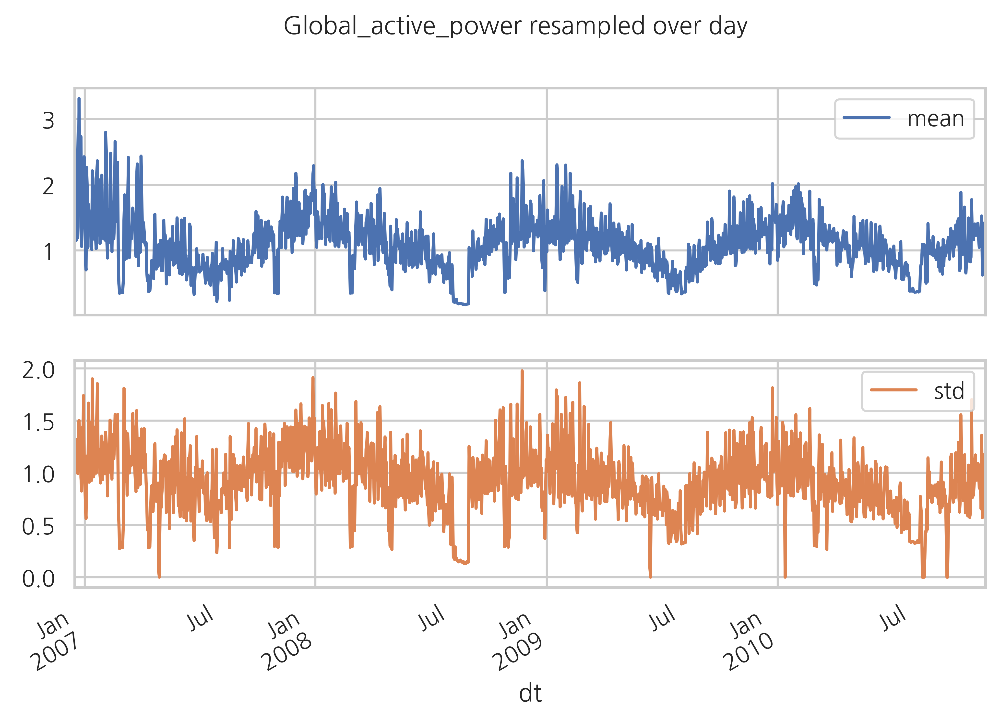

In [5]:
# mean & std of Global_active_power per day
a = df.Global_active_power.resample('D').agg(['mean', 'std'])
a.plot(subplots = True, title='Global_active_power resampled over day') 
plt.show()

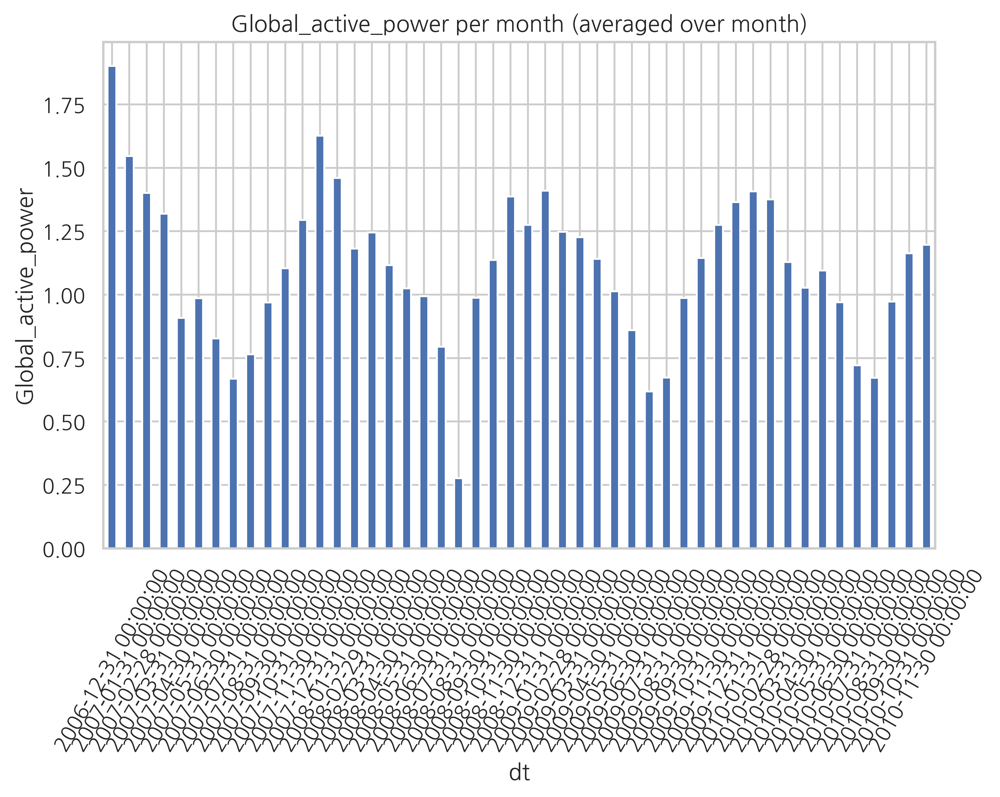

In [15]:
# Sum of 'Global_active_power' resampled over month
df['Global_active_power'].resample('M').mean().plot(kind='bar')
plt.xticks(rotation=60)
plt.ylabel('Global_active_power')
plt.title('Global_active_power per month (averaged over month)')
plt.show()

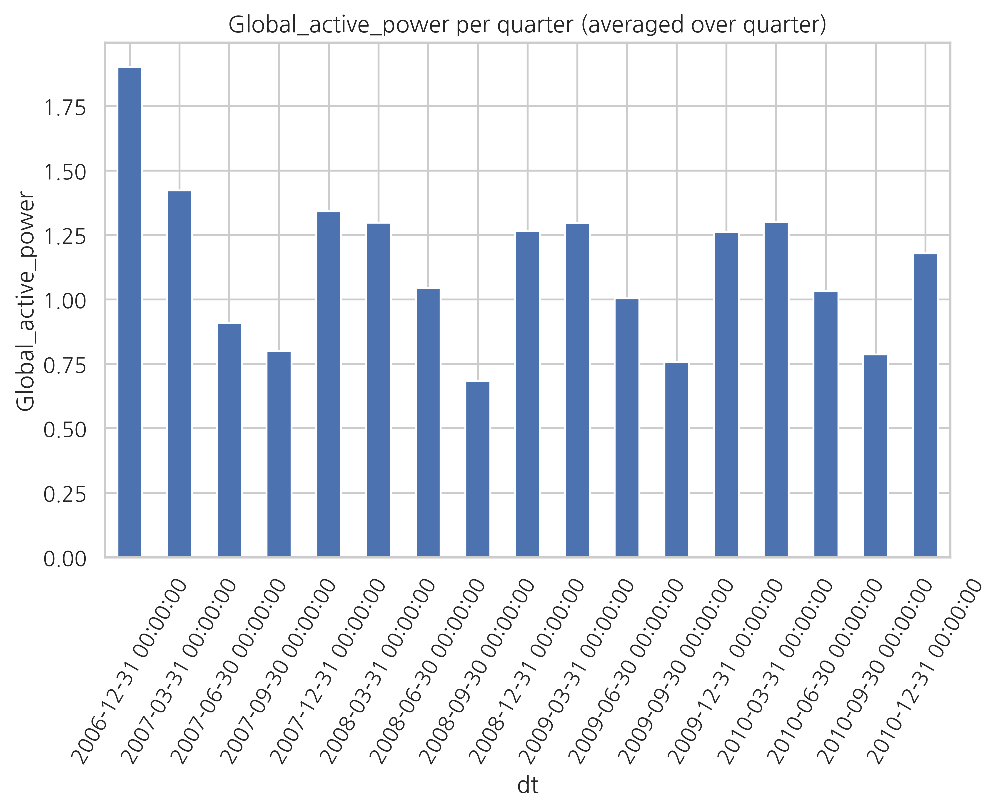

In [16]:
## Mean of 'Global_active_power' resampled over quarter
df['Global_active_power'].resample('Q').mean().plot(kind='bar')
plt.xticks(rotation=60)
plt.ylabel('Global_active_power')
plt.title('Global_active_power per quarter (averaged over quarter)')
plt.show()

In [60]:
df1 = df["2007"]
df2 = df["2008"]
df3 = df["2009"]
df4 = df["2010"]
df5 = pd.concat([df1, df2, df3, df4])

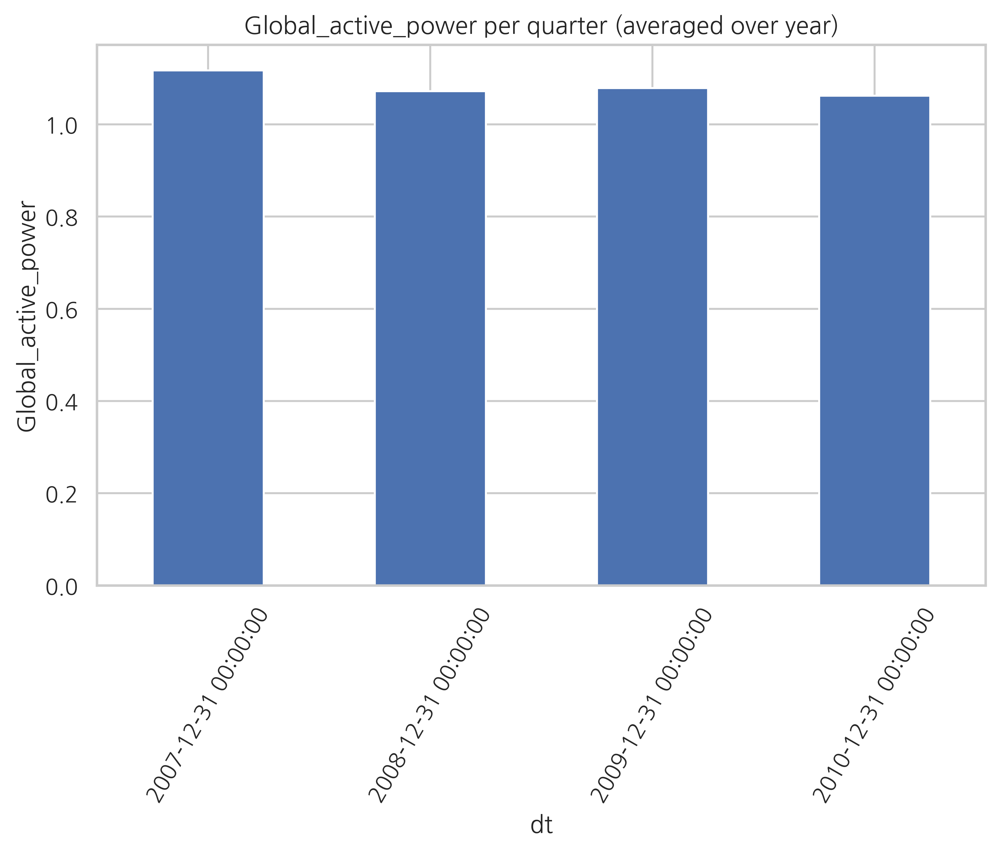

In [65]:
## Mean of 'Global_active_power' resampled over quarter
df5['Global_active_power'].resample('A').mean().plot(kind='bar')
plt.xticks(rotation=60)
plt.ylabel('Global_active_power')
plt.title('Global_active_power per quarter (averaged over year)')
plt.show()

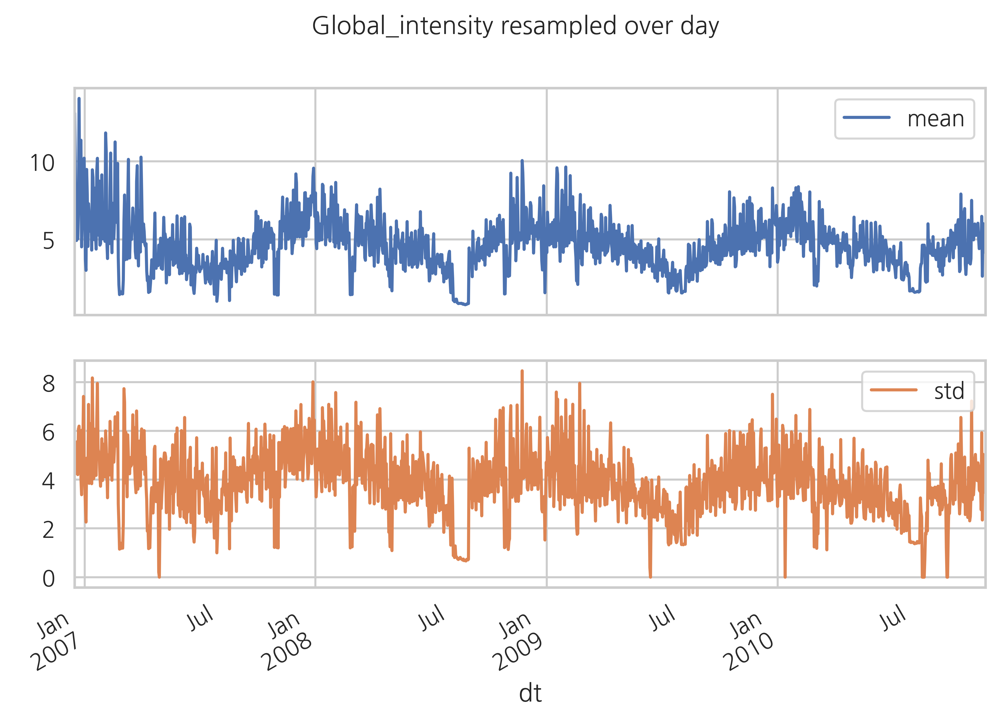

In [2]:
# mean & std of Global_intesity per day
r = df.Global_intensity.resample('D').agg(['mean', 'std'])
r.plot(subplots = True, title='Global_intensity resampled over day')
plt.show()

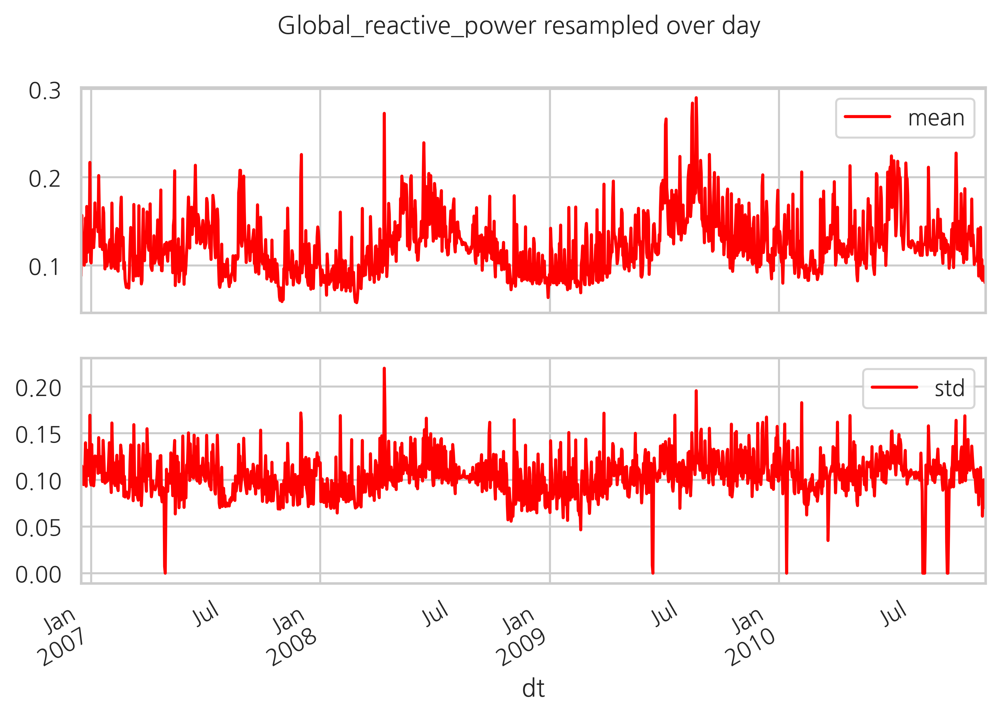

In [7]:
# mean & std of Global_reactive_power per day
r2 = df.Global_reactive_power.resample('D').agg(['mean', 'std'])
r2.plot(subplots = True, title='Global_reactive_power resampled over day', color='red')
plt.show()

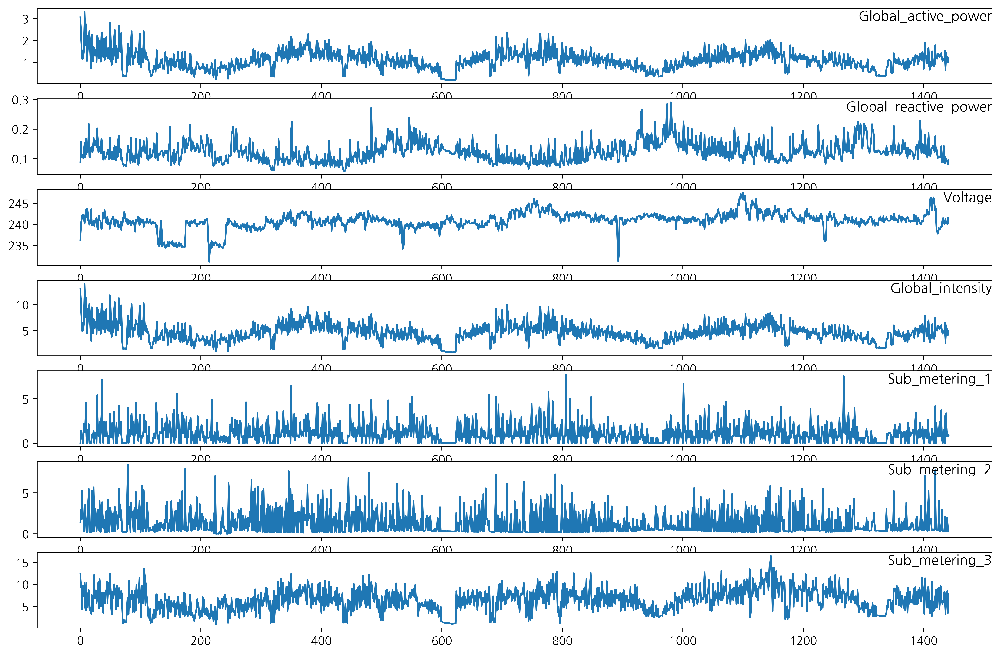

In [22]:
# mean of different features resampled over day. 
# specify columns to plot
cols = [0, 1, 2, 3, 4, 5, 6]
i = 1
values = df.resample('D').mean().values
# plot each column
plt.figure(figsize=(15, 10))
for col in cols:
	plt.subplot(len(cols), 1, i)
	plt.plot(values[:, col])
	plt.title(df.columns[col], y=0.75, loc='right')
	i += 1
plt.show()

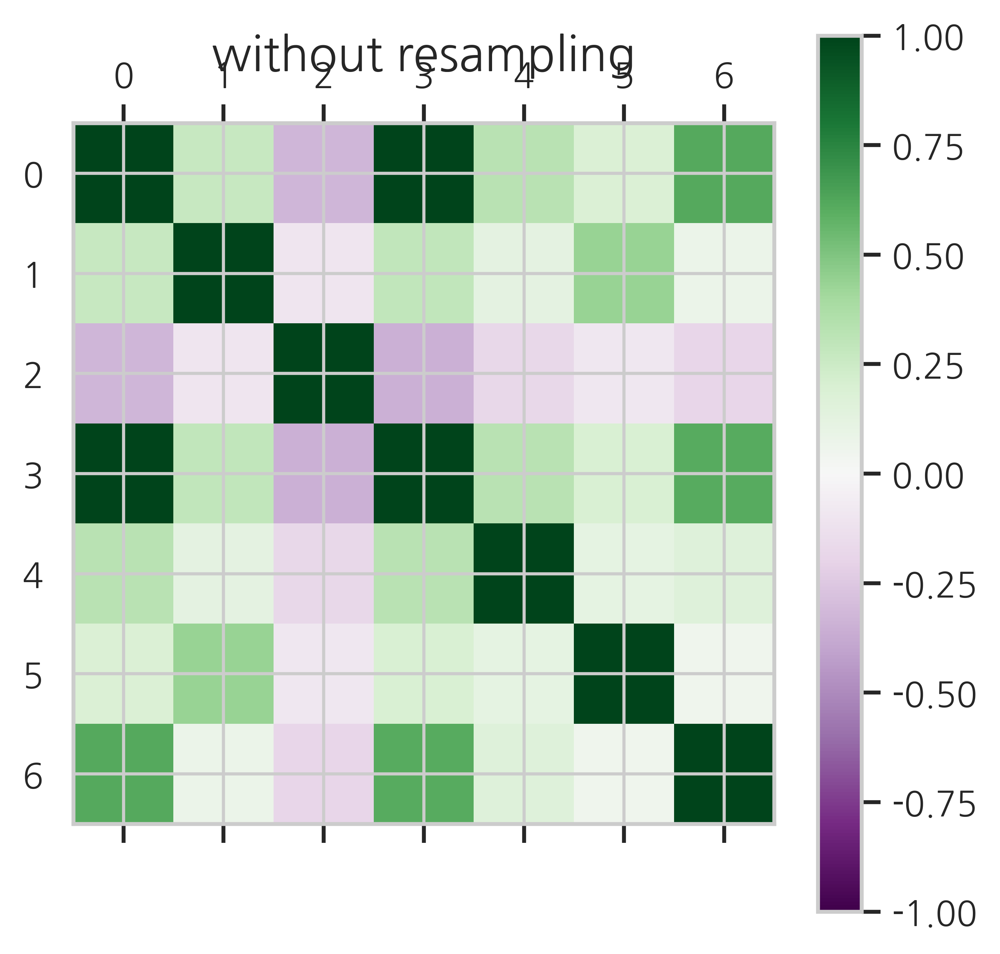

In [14]:
# Correlations among columns
plt.matshow(df.corr(method='spearman'),vmax=1,vmin=-1,cmap='PRGn')
plt.title('without resampling', size=15)
plt.colorbar()
plt.show()

<Figure size 1500x900 with 0 Axes>

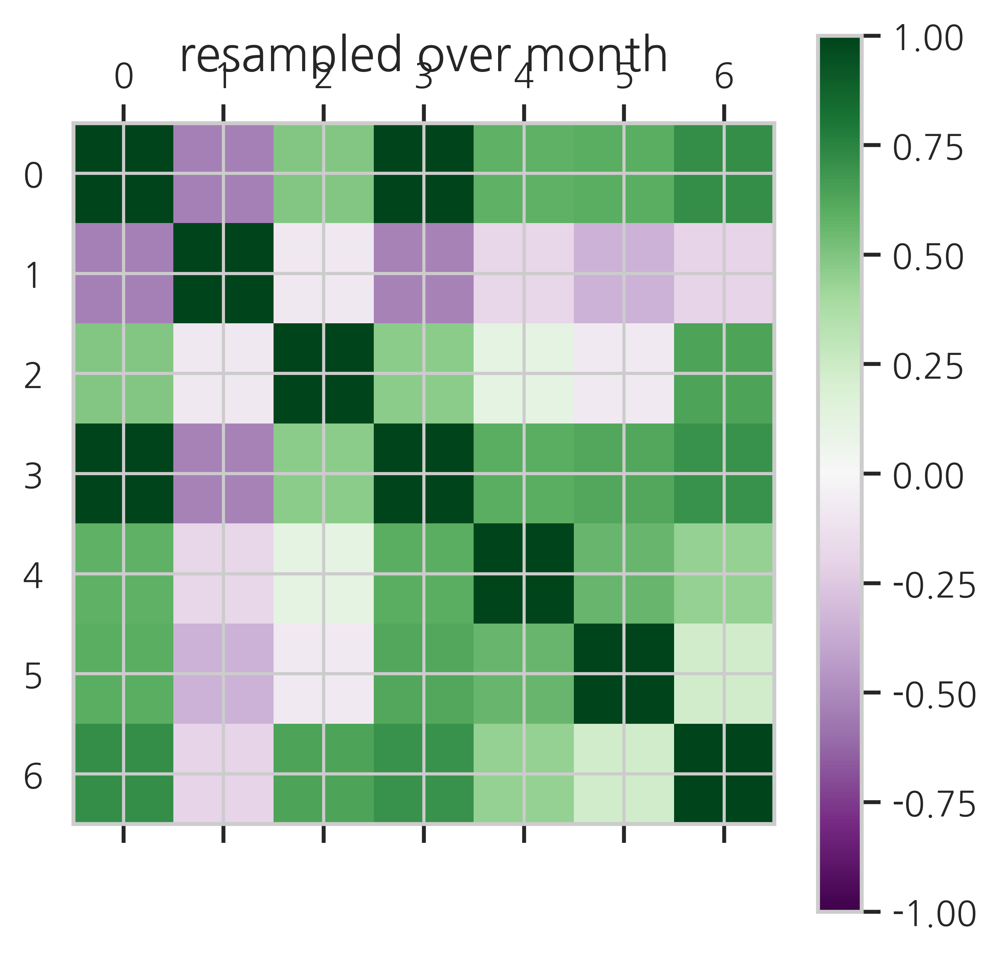

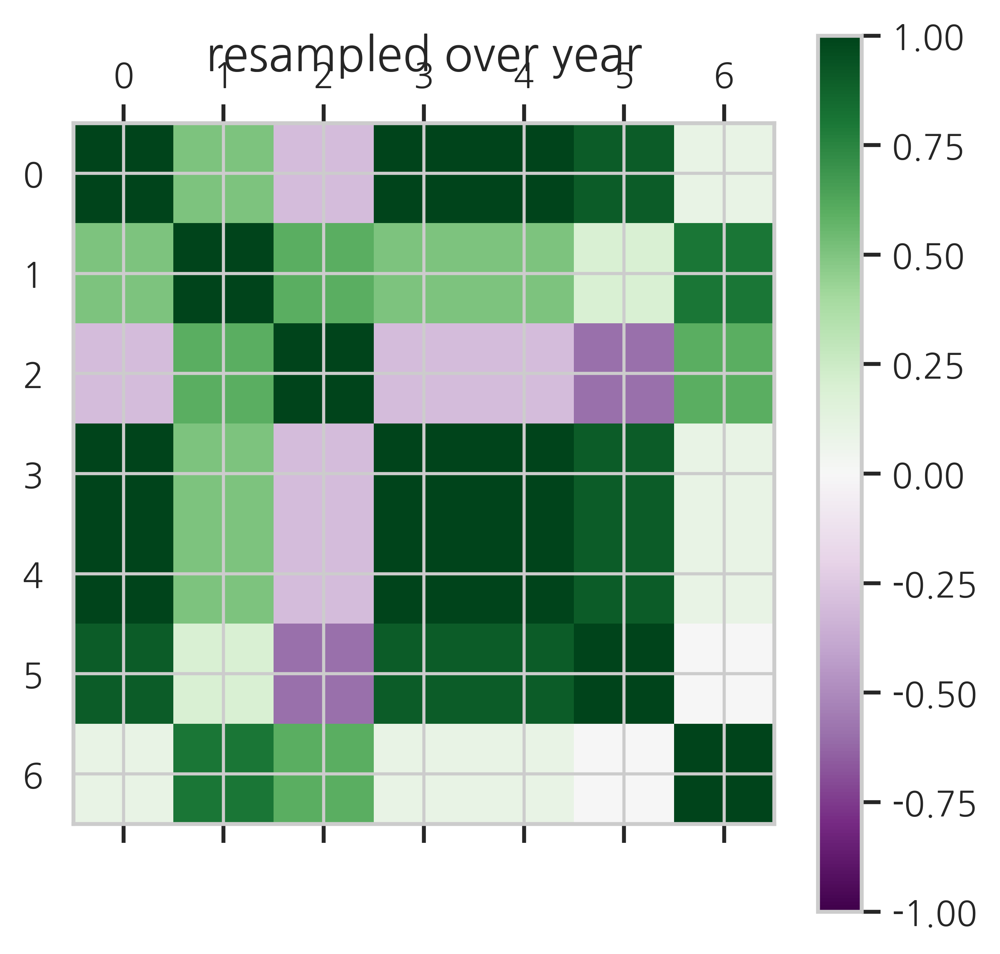

In [13]:
# Correlations of mean of features resampled over months

plt.figure(figsize=(5, 3))
plt.matshow(df.resample('M').mean().corr(method='spearman'),vmax=1,vmin=-1,cmap='PRGn')
plt.title('resampled over month', size=15)
plt.colorbar()
plt.margins(0.02)
plt.matshow(df.resample('A').mean().corr(method='spearman'),vmax=1,vmin=-1,cmap='PRGn')
plt.title('resampled over year', size=15)
plt.colorbar()
plt.show()

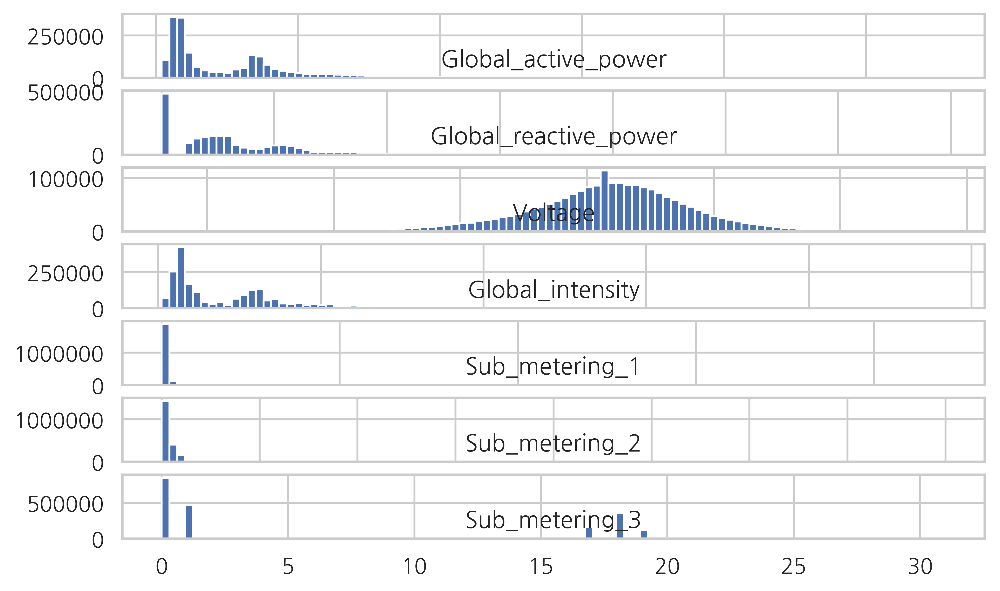

In [67]:
plt.figure()
for i in range(len(df.columns)):
    plt.subplot(len(df.columns), 1, i+1)
    name = df.columns[i]
    df[name].hist(bins=100)
    plt.title(name, y=0)
plt.show()

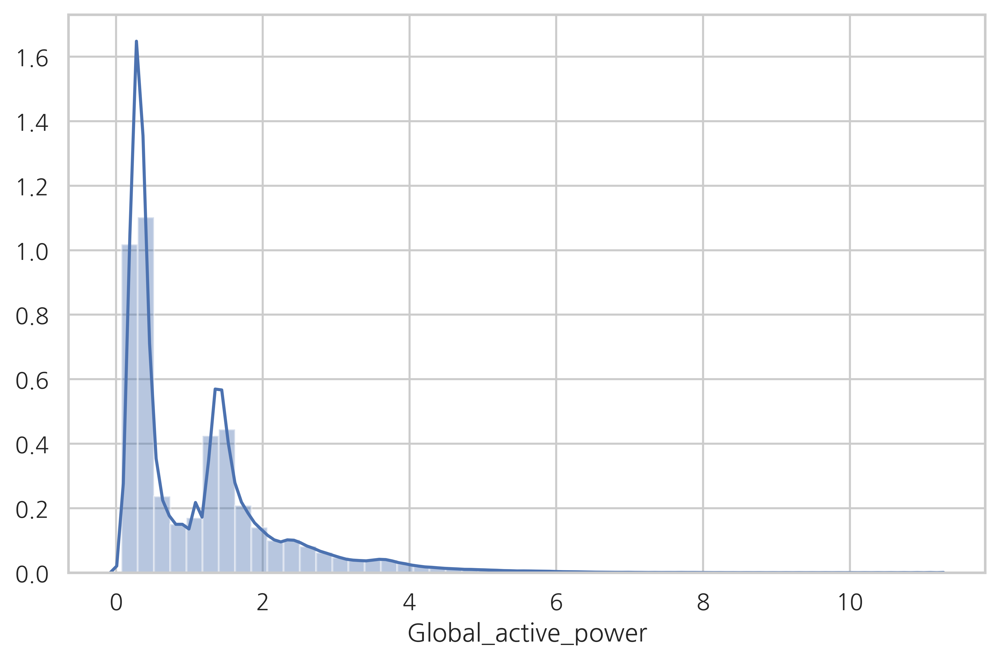

In [74]:
sns.distplot(df["Global_active_power"])

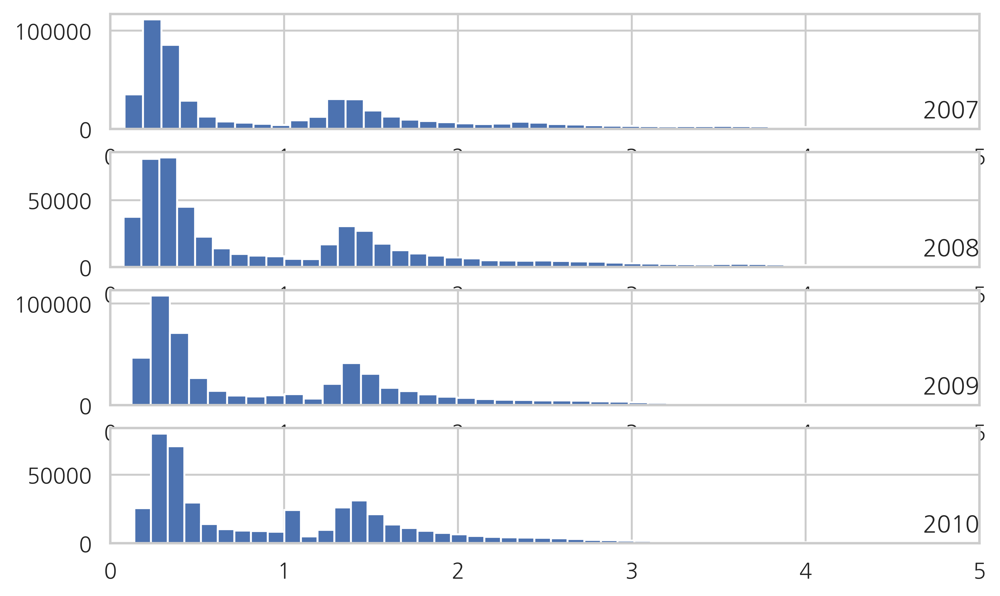

In [77]:
years = ['2007', '2008', '2009', '2010']
plt.figure()
for i in range(len(years)):
    # prepare subplot
    ax = plt.subplot(len(years), 1, i+1)
    # determine the year to plot
    year = years[i]
    # get all observations for the year
    result = df[str(year)]
    # plot the active power for the year
    result['Global_active_power'].hist(bins=100)
    # zoom in on the distribution
    ax.set_xlim(0, 5)
    # add a title to the subplot
    plt.title(str(year), y=0, loc='right')
plt.show()

In [12]:
formula = "Global_active_power ~ " + \
"(scale(Global_reactive_power) + scale(Voltage) + scale(Global_intensity) + scale(Sub_metering_1) + scale(Sub_metering_2) + scale(Sub_metering_3))"
model_first = sm.OLS.from_formula(formula, data = df)
result_first = model_first.fit()
print(result_first.summary())

                             OLS Regression Results                            
Dep. Variable:     Global_active_power   R-squared:                       0.999
Model:                             OLS   Adj. R-squared:                  0.999
Method:                  Least Squares   F-statistic:                 2.340e+08
Date:                 Sun, 14 Jun 2020   Prob (F-statistic):               0.00
Time:                         22:42:53   Log-Likelihood:             3.7165e+06
No. Observations:              2075259   AIC:                        -7.433e+06
Df Residuals:                  2075252   BIC:                        -7.433e+06
Df Model:                            6                                         
Covariance Type:             nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Interc

In [13]:
# partial regression plot
fig = plt.figure(figsize=(8, 20))
sm.graphics.plot_partregress_grid(result_first, fig=fig)
fig.suptitle("")
plt.show()

### Sliding Window

In [1]:
df = pd.read_csv('household_power_consumption.csv', header=0, infer_datetime_format=True, parse_dates=['dt'], index_col=['dt'])
df.head()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
dt,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0
2006-12-16 17:25:00,5.360,0.436,233.63,23.0,0.0,1.0,16.0
2006-12-16 17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0
2006-12-16 17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0
2006-12-16 17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0


In [13]:
de_df = df[["Global_reactive_power", "Voltage", "Global_intensity", "Sub_metering_1", "Sub_metering_2", "Sub_metering_3"]].resample('1H').agg(['mean'])
de_df.head()

,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
,mean,mean,mean,mean,mean,mean
dt,,,,,,
2006-12-16 17:00:00,0.229000,234.643889,18.100000,0.0,0.527778,16.861111
2006-12-16 18:00:00,0.080033,234.580167,15.600000,0.0,6.716667,16.866667
2006-12-16 19:00:00,0.085233,233.232500,14.503333,0.0,1.433333,16.683333
2006-12-16 20:00:00,0.075100,234.071500,13.916667,0.0,0.000000,16.783333
2006-12-16 21:00:00,0.076667,237.158667,13.046667,0.0,0.416667,17.216667


In [18]:
de_df.tail()

,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
,mean,mean,mean,mean,mean,mean
dt,,,,,,
2010-11-26 17:00:00,0.061400,237.069667,7.216667,0.0,0.000000,12.866667
2010-11-26 18:00:00,0.053700,237.531833,6.620000,0.0,0.000000,0.000000
2010-11-26 19:00:00,0.060033,236.741000,7.056667,0.0,0.066667,0.000000
2010-11-26 20:00:00,0.061167,239.396000,4.913333,0.0,1.066667,0.000000
2010-11-26 21:00:00,0.000000,239.690000,3.800000,0.0,0.000000,0.000000


In [19]:
len(de_df)

34589

In [20]:
de_df.drop(de_df.index[34588], inplace=True)
de_df.tail()

,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
,mean,mean,mean,mean,mean,mean
dt,,,,,,
2010-11-26 16:00:00,0.215633,240.457833,4.610000,0.0,0.950000,0.000000
2010-11-26 17:00:00,0.061400,237.069667,7.216667,0.0,0.000000,12.866667
2010-11-26 18:00:00,0.053700,237.531833,6.620000,0.0,0.000000,0.000000
2010-11-26 19:00:00,0.060033,236.741000,7.056667,0.0,0.066667,0.000000
2010-11-26 20:00:00,0.061167,239.396000,4.913333,0.0,1.066667,0.000000


In [15]:
inde_df = df["Global_active_power"].resample('1H').agg(['mean'])
inde_df.head()

,mean
dt,
2006-12-16 17:00:00,4.222889
2006-12-16 18:00:00,3.632200
2006-12-16 19:00:00,3.400233
2006-12-16 20:00:00,3.268567
2006-12-16 21:00:00,3.056467


In [17]:
inde_df.drop(inde_df.index[0], inplace=True)
inde_df.head()

,mean
dt,
2006-12-16 18:00:00,3.632200
2006-12-16 19:00:00,3.400233
2006-12-16 20:00:00,3.268567
2006-12-16 21:00:00,3.056467
2006-12-16 22:00:00,2.200133


In [27]:
idx = inde_df.index - 1

In [30]:
inde_df.index = [idx]

In [31]:
inde_df.head()

,mean
dt,
2006-12-16 17:00:00,3.632200
2006-12-16 18:00:00,3.400233
2006-12-16 19:00:00,3.268567
2006-12-16 20:00:00,3.056467
2006-12-16 21:00:00,2.200133


In [34]:
de_df.head()

,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
,mean,mean,mean,mean,mean,mean
dt,,,,,,
2006-12-16 17:00:00,0.229000,234.643889,18.100000,0.0,0.527778,16.861111
2006-12-16 18:00:00,0.080033,234.580167,15.600000,0.0,6.716667,16.866667
2006-12-16 19:00:00,0.085233,233.232500,14.503333,0.0,1.433333,16.683333
2006-12-16 20:00:00,0.075100,234.071500,13.916667,0.0,0.000000,16.783333
2006-12-16 21:00:00,0.076667,237.158667,13.046667,0.0,0.416667,17.216667


In [36]:
df_1h = pd.concat([inde_df, de_df], axis=1, join="inner")
df_1h.tail()

,mean,"(Global_reactive_power, mean)","(Voltage, mean)","(Global_intensity, mean)","(Sub_metering_1, mean)","(Sub_metering_2, mean)","(Sub_metering_3, mean)"
dt,,,,,,,
